## Create Organized CSV of the results
In this section I will create organied csv of the results.
- Organized by the day shooting of each of the flower
- Version without the shooting from days 2 and 8 (results werent good)

In [2]:
import pandas as pd

flowers_df = pd.read_csv('/sise/shanigu-group/etaylor/assessing_cannabis_exp/results/csv_results/raw/class_distribution_per_folder.csv')
images_df = pd.read_csv('/sise/shanigu-group/etaylor/assessing_cannabis_exp/results/csv_results/raw/class_distribution_per_image.csv')

In [24]:
flowers_df.head()

,day,location,number,clear_count,cloudy_count,amber_count,clear_normalized,cloudy_normalized,amber_normalized
0,day_1_2024_05_30,greenhouse,30,21,10,0,0.6774,0.3226,0.0000
1,day_1_2024_05_30,greenhouse,29,97,148,0,0.3959,0.6041,0.0000
2,day_1_2024_05_30,greenhouse,28,108,48,8,0.6585,0.2927,0.0488
3,day_1_2024_05_30,greenhouse,27,91,396,6,0.1846,0.8032,0.0122
4,day_1_2024_05_30,greenhouse,26,15,94,6,0.1304,0.8174,0.0522


In [25]:
images_df.head()

,day,location,number,image,clear_count,cloudy_count,amber_count,clear_normalized,cloudy_normalized,amber_normalized
0,day_1_2024_05_30,greenhouse,30,IMG_5153,0,0,0,0.0000,0.0000,0.0
1,day_1_2024_05_30,greenhouse,30,IMG_5154,0,1,0,0.0000,1.0000,0.0
2,day_1_2024_05_30,greenhouse,30,IMG_5155,6,3,0,0.6667,0.3333,0.0
3,day_1_2024_05_30,greenhouse,30,IMG_5156,15,6,0,0.7143,0.2857,0.0
4,day_1_2024_05_30,greenhouse,29,IMG_5037,19,34,0,0.3585,0.6415,0.0


In [3]:
df = flowers_df

# Extract the day number and reassign flower indices correctly
df['day_number'] = df['day'].apply(lambda x: int(x.split('_')[1]))
df['flower_id'] = (df['number'] - 1) % 30 + 1

# Sort the data by flower_id and then by day_number
df_sorted = df.sort_values(by=['flower_id', 'day_number'])

# Process the images DataFrame to calculate the number of images per flower per day for greenhouse
images_df['day_number'] = images_df['day'].apply(lambda x: int(x.split('_')[1]))
images_df['flower_id'] = (images_df['number'] - 1) % 30 + 1

greenhouse_images_df = images_df[images_df['location'] == 'greenhouse']
lab_images_df = images_df[images_df['location'] == 'lab']

num_images_per_flower_day_greenhouse = greenhouse_images_df.groupby(['day_number', 'flower_id']).size().reset_index(name='num_images')
num_images_per_flower_day_lab = lab_images_df.groupby(['day_number', 'flower_id']).size().reset_index(name='num_images')



In [4]:
images_df.head()

,day,location,number,image,clear_count,cloudy_count,amber_count,clear_normalized,cloudy_normalized,amber_normalized,day_number,flower_id
0,day_1_2024_05_30,greenhouse,30,IMG_5153,0,0,0,0.0000,0.0000,0.0,1,30
1,day_1_2024_05_30,greenhouse,30,IMG_5154,0,1,0,0.0000,1.0000,0.0,1,30
2,day_1_2024_05_30,greenhouse,30,IMG_5155,6,3,0,0.6667,0.3333,0.0,1,30
3,day_1_2024_05_30,greenhouse,30,IMG_5156,15,6,0,0.7143,0.2857,0.0,1,30
4,day_1_2024_05_30,greenhouse,29,IMG_5037,19,34,0,0.3585,0.6415,0.0,1,29


In [28]:
# Sort the data by location, flower_id, and day_number
df_sorted_by_location = df.sort_values(by=['location', 'flower_id', 'day_number'])

df_greenhouse = df_sorted_by_location[df_sorted_by_location['location'] == 'greenhouse']
df_lab = df_sorted_by_location[df_sorted_by_location['location'] == 'lab']

# Merge the number of images with the greenhouse and lab data
df_greenhouse = df_greenhouse.merge(num_images_per_flower_day_greenhouse, on=['day_number', 'flower_id'], how='left')
df_lab = df_lab.merge(num_images_per_flower_day_lab, on=['day_number', 'flower_id'], how='left')


In [29]:
df_greenhouse.head()

,day,location,number,clear_count,cloudy_count,amber_count,clear_normalized,cloudy_normalized,amber_normalized,day_number,flower_id,num_images
0,day_1_2024_05_30,greenhouse,1,222,489,26,0.3012,0.6635,0.0353,1,1,10
1,day_2_2024_06_03,greenhouse,31,53,96,38,0.2834,0.5134,0.2032,2,1,14
2,day_3_2024_06_06,greenhouse,61,652,1251,49,0.3340,0.6409,0.0251,3,1,11
3,day_4_2024_06_10,greenhouse,91,443,1844,48,0.1897,0.7897,0.0206,4,1,8
4,day_5_2024_06_13,greenhouse,121,117,1056,75,0.0938,0.8462,0.0601,5,1,6


In [30]:
df_lab.head()

,day,location,number,clear_count,cloudy_count,amber_count,clear_normalized,cloudy_normalized,amber_normalized,day_number,flower_id,num_images
0,day_2_2024_06_03,lab,31,1377,147,45,0.8776,0.0937,0.0287,2,1,21
1,day_3_2024_06_06,lab,61,210,702,35,0.2218,0.7413,0.0370,3,1,6
2,day_4_2024_06_10,lab,91,572,1887,102,0.2234,0.7368,0.0398,4,1,7
3,day_5_2024_06_13,lab,121,376,825,21,0.3077,0.6751,0.0172,5,1,10
4,day_6_2024_06_17,lab,151,299,841,42,0.2530,0.7115,0.0355,6,1,6


In [7]:
# save dfs to csv
df_sorted.to_csv('/sise/shanigu-group/etaylor/assessing_cannabis_exp/results/csv_results/sorted/class_distribution_per_folder_sorted.csv', index=False)
df_lab.to_csv('/sise/shanigu-group/etaylor/assessing_cannabis_exp/results/csv_results/sorted/class_distribution_per_folder_sorted_lab.csv', index=False)
df_greenhouse.to_csv('/sise/shanigu-group/etaylor/assessing_cannabis_exp/results/csv_results/sorted/class_distribution_per_folder_sorted_greenhouse.csv', index=False)

In [31]:
df_sorted_excluded = df_sorted[~df_sorted['day_number'].isin([2, 8])]
df_greenhouse_excluded = df_greenhouse[~df_greenhouse['day_number'].isin([2, 8])]
df_lab_excluded = df_lab[~df_lab['day_number'].isin([2, 8])]

In [18]:
df_greenhouse_excluded.head()

,day,location,number,clear_count,cloudy_count,amber_count,clear_normalized,cloudy_normalized,amber_normalized,day_number,flower_id,num_images
0,day_1_2024_05_30,greenhouse,1,222,489,26,0.3012,0.6635,0.0353,1,1,10
2,day_3_2024_06_06,greenhouse,61,652,1251,49,0.3340,0.6409,0.0251,3,1,17
3,day_4_2024_06_10,greenhouse,91,443,1844,48,0.1897,0.7897,0.0206,4,1,15
4,day_5_2024_06_13,greenhouse,121,117,1056,75,0.0938,0.8462,0.0601,5,1,16
5,day_6_2024_06_17,greenhouse,151,195,1156,46,0.1396,0.8275,0.0329,6,1,15


In [ ]:
# save csv
df_sorted_excluded.to_csv('/sise/shanigu-group/etaylor/assessing_cannabis_exp/results/csv_results/collected_class_distribution_per_folder_sorted.csv', index=False)
df_greenhouse_excluded.to_csv('/sise/shanigu-group/etaylor/assessing_cannabis_exp/results/csv_results/collected_class_distribution_per_folder_greenhouse_sorted.csv', index=False)
df_lab_excluded.to_csv('/sise/shanigu-group/etaylor/assessing_cannabis_exp/results/csv_results/collected_class_distribution_per_folder_lab_sorted.csv', index=False)

## Analysis of the Results
In this section I will analysis the results received.
- I want to check how many flowers are change their trichome dist from clear to cloudy and then amber.
- How many did not changed their dist accordingly
- How many In the end have high percentage of amber and not cloudy or clear
- Try to segments the different flowers and see if they have the same characteristics (same trichome proportions)


In [5]:
df_greenhouse_excluded.head()

,day,location,number,clear_count,cloudy_count,amber_count,clear_normalized,cloudy_normalized,amber_normalized,day_number,flower_id
29,day_1_2024_05_30,greenhouse,1,222,489,26,0.3012,0.6635,0.0353,1,1
86,day_3_2024_06_06,greenhouse,61,652,1251,49,0.3340,0.6409,0.0251,3,1
152,day_4_2024_06_10,greenhouse,91,443,1844,48,0.1897,0.7897,0.0206,4,1
209,day_5_2024_06_13,greenhouse,121,117,1056,75,0.0938,0.8462,0.0601,5,1
287,day_6_2024_06_17,greenhouse,151,195,1156,46,0.1396,0.8275,0.0329,6,1


In [19]:
df_lab_excluded.head()

,day,location,number,clear_count,cloudy_count,amber_count,clear_normalized,cloudy_normalized,amber_normalized,day_number,flower_id
132,day_3_2024_06_06,lab,61,210,702,35,0.2218,0.7413,0.0370,3,1
196,day_4_2024_06_10,lab,91,572,1887,102,0.2234,0.7368,0.0398,4,1
236,day_5_2024_06_13,lab,121,376,825,21,0.3077,0.6751,0.0172,5,1
310,day_6_2024_06_17,lab,151,299,841,42,0.2530,0.7115,0.0355,6,1
365,day_7_2024_06_20,lab,181,336,795,76,0.2784,0.6587,0.0630,7,1


To analyze how many flowers change their trichome distribution from clear to cloudy and then to amber, we can follow these steps:

 **Identify the trend for each flower**: For each flower, check the trend in trichome counts over the days.

### Step-by-Step Approach

1. **Calculate the Trends**: For each flower, calculate the proportion of trichomes that are clear, cloudy, and amber for each day.
2. **Identify Changes**: Check how the proportions change over time for each flower.


In [43]:
import matplotlib.pyplot as plt

def plot_normalized_trends_subplots(df, location_name):
    flower_ids = df['flower_id'].unique()
    num_flowers = len(flower_ids)
    
    fig, axes = plt.subplots(15, 2, figsize=(20, 60))
    axes = axes.flatten()

    for ax, flower_id in zip(axes, flower_ids):
        flower_data = df[df['flower_id'] == flower_id].sort_values(by='day_number')
        days = flower_data['day_number'].values
        clear_trend = flower_data['clear_normalized'].values
        cloudy_trend = flower_data['cloudy_normalized'].values
        amber_trend = flower_data['amber_normalized'].values
        num_images = flower_data['num_images'].values

        ax.plot(days, clear_trend, label='Clear', color='blue')
        ax.plot(days, cloudy_trend, label='Cloudy', color='green')
        ax.plot(days, amber_trend, label='Amber', color='red')

        for i in range(len(days)):
            ax.annotate(f'{clear_trend[i]:.2f}', (days[i], clear_trend[i]), textcoords="offset points", xytext=(0,5), ha='center', color='blue')
            ax.annotate(f'{cloudy_trend[i]:.2f}', (days[i], cloudy_trend[i]), textcoords="offset points", xytext=(0,5), ha='center', color='green')
            ax.annotate(f'{amber_trend[i]:.2f}', (days[i], amber_trend[i]), textcoords="offset points", xytext=(0,5), ha='center', color='red')

        ax.set_ylabel(f'Flower {flower_id}')
        ax.legend()

        # Set x-axis labels with the number of images
        xticks_labels = [f'{day}\n({num})' for day, num in zip(days, num_images)]
        ax.set_xticks(days)
        ax.set_xticklabels(xticks_labels, rotation=45, ha='right')

    plt.suptitle(f'Trichome Trends Over Time for {location_name}')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


def plot_trends_subplots(df, location_name):
    flower_ids = df['flower_id'].unique()
    num_flowers = len(flower_ids)
    
    fig, axes = plt.subplots(15, 2, figsize=(20, 60))
    axes = axes.flatten()

    for ax, flower_id in zip(axes, flower_ids):
        flower_data = df[df['flower_id'] == flower_id].sort_values(by='day_number')
        days = flower_data['day_number'].values
        clear_trend = flower_data['clear_count'].values
        cloudy_trend = flower_data['cloudy_count'].values
        amber_trend = flower_data['amber_count'].values
        num_images = flower_data['num_images'].values

        ax.plot(days, clear_trend, label='Clear', color='blue')
        ax.plot(days, cloudy_trend, label='Cloudy', color='green')
        ax.plot(days, amber_trend, label='Amber', color='red')

        for i in range(len(days)):
            ax.annotate(f'{clear_trend[i]}', (days[i], clear_trend[i]), textcoords="offset points", xytext=(0,5), ha='center', color='blue')
            ax.annotate(f'{cloudy_trend[i]}', (days[i], cloudy_trend[i]), textcoords="offset points", xytext=(0,5), ha='center', color='green')
            ax.annotate(f'{amber_trend[i]}', (days[i], amber_trend[i]), textcoords="offset points", xytext=(0,5), ha='center', color='red')

        ax.set_ylabel(f'Flower {flower_id}')
        ax.legend()

        # Set x-axis labels with the number of images
        xticks_labels = [f'{day}\n({num})' for day, num in zip(days, num_images)]
        ax.set_xticks(days)
        ax.set_xticklabels(xticks_labels, rotation=45, ha='right')

    plt.suptitle(f'Trichome Trends Over Time for {location_name}')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    

def plot_combined_trends_subplots(df, location_name):
    flower_ids = df['flower_id'].unique()
    num_flowers = len(flower_ids)
    
    fig, axes = plt.subplots(num_flowers, 2, figsize=(30, num_flowers * 4))
    axes = axes.flatten()

    for idx, flower_id in enumerate(flower_ids):
        flower_data = df[df['flower_id'] == flower_id].sort_values(by='day_number')
        days = flower_data['day_number'].values
        clear_trend = flower_data['clear_normalized'].values
        cloudy_trend = flower_data['cloudy_normalized'].values
        amber_trend = flower_data['amber_normalized'].values
        clear_count = flower_data['clear_count'].values
        cloudy_count = flower_data['cloudy_count'].values
        amber_count = flower_data['amber_count'].values
        num_images = flower_data['num_images'].values

        # Plot normalized trends
        ax_norm = axes[idx * 2]
        ax_norm.plot(days, clear_trend, label='Clear', color='blue')
        ax_norm.plot(days, cloudy_trend, label='Cloudy', color='green')
        ax_norm.plot(days, amber_trend, label='Amber', color='red')
        for i in range(len(days)):
            ax_norm.annotate(f'{clear_trend[i]:.2f}', (days[i], clear_trend[i]), textcoords="offset points", xytext=(0,5), ha='center', color='blue')
            ax_norm.annotate(f'{cloudy_trend[i]:.2f}', (days[i], cloudy_trend[i]), textcoords="offset points", xytext=(0,5), ha='center', color='green')
            ax_norm.annotate(f'{amber_trend[i]:.2f}', (days[i], amber_trend[i]), textcoords="offset points", xytext=(0,5), ha='center', color='red')
        ax_norm.set_ylabel(f'Flower {flower_id} (Normalized)')
        ax_norm.legend()
        xticks_labels = [f'{day}\n({num})' for day, num in zip(days, num_images)]
        ax_norm.set_xticks(days)
        ax_norm.set_xticklabels(xticks_labels, rotation=45, ha='right')

        # Plot non-normalized trends
        ax_count = axes[idx * 2 + 1]
        ax_count.plot(days, clear_count, label='Clear', color='blue')
        ax_count.plot(days, cloudy_count, label='Cloudy', color='green')
        ax_count.plot(days, amber_count, label='Amber', color='red')
        for i in range(len(days)):
            ax_count.annotate(f'{clear_count[i]}', (days[i], clear_count[i]), textcoords="offset points", xytext=(0,5), ha='center', color='blue')
            ax_count.annotate(f'{cloudy_count[i]}', (days[i], cloudy_count[i]), textcoords="offset points", xytext=(0,5), ha='center', color='green')
            ax_count.annotate(f'{amber_count[i]}', (days[i], amber_count[i]), textcoords="offset points", xytext=(0,5), ha='center', color='red')
        ax_count.set_ylabel(f'Flower {flower_id} (Count)')
        ax_count.legend()
        xticks_labels = [f'{day}\n({num})' for day, num in zip(days, num_images)]
        ax_count.set_xticks(days)
        ax_count.set_xticklabels(xticks_labels, rotation=45, ha='right')

    plt.suptitle(f'Trichome Trends Over Time for {location_name}')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


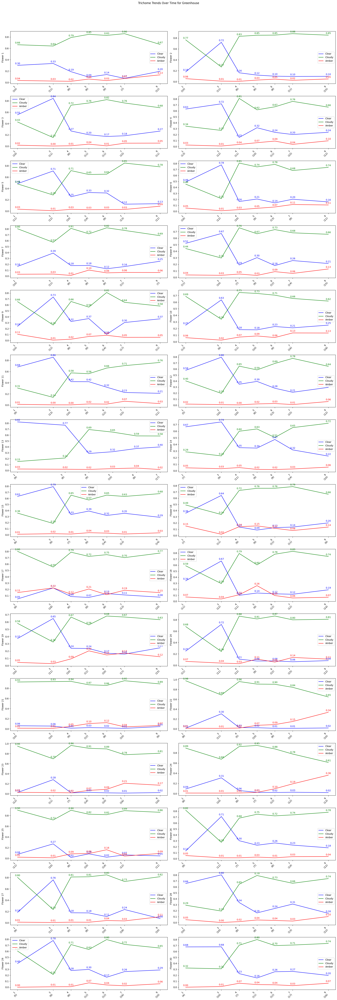

In [34]:
# Plot trends for greenhouse and lab
plot_normalized_trends_subplots(df_greenhouse_excluded, 'Greenhouse')


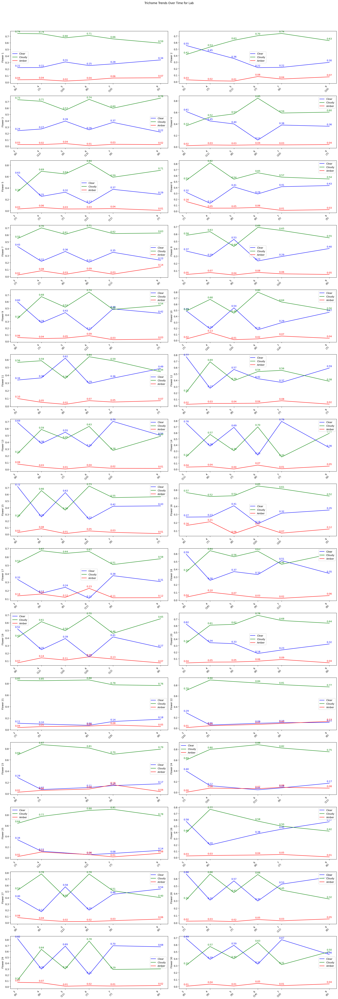

In [35]:
plot_normalized_trends_subplots(df_lab_excluded, 'Lab')

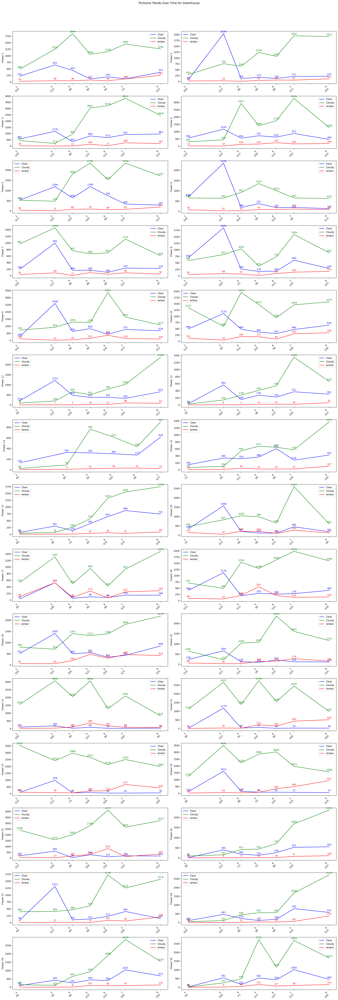

In [36]:
plot_trends_subplots(df_greenhouse_excluded, 'Greenhouse')


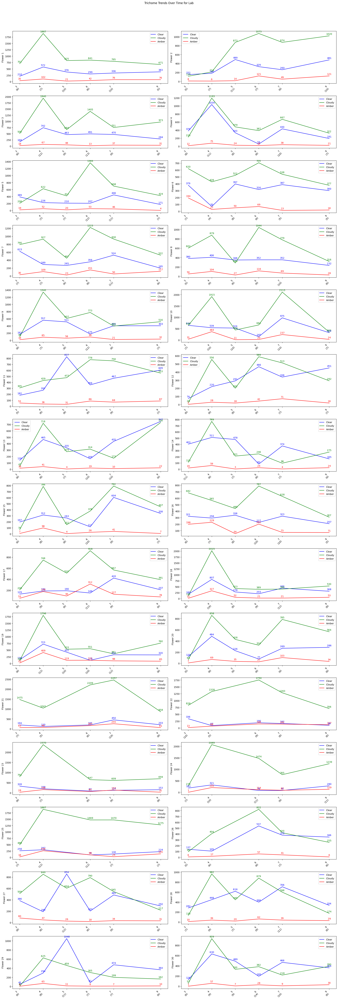

In [37]:
plot_trends_subplots(df_lab_excluded, 'Lab')


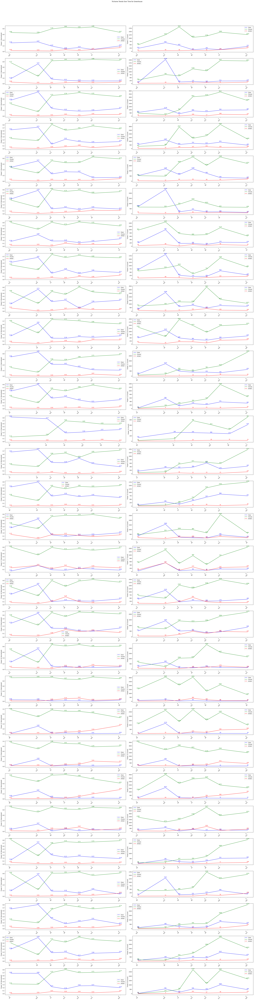

In [44]:
plot_combined_trends_subplots(df_greenhouse_excluded, 'Greenhouse')

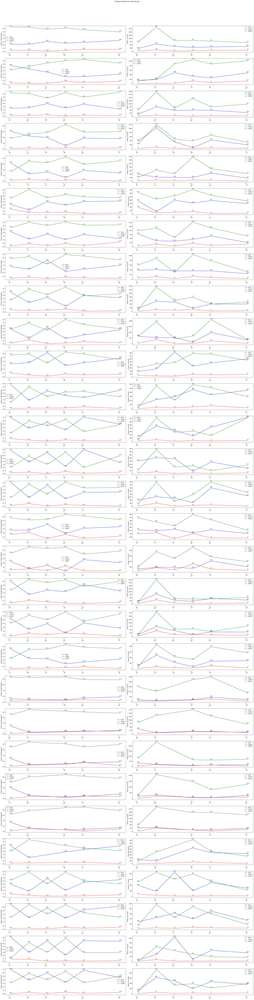

In [45]:
plot_combined_trends_subplots(df_lab_excluded, 'Lab')

### Dist of Trichomes for each flower